In [1]:
from PIL import Image, ImageOps, ImageFilter
import plotly.graph_objects as go
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt

In [2]:
def toGrayscale(img):
    new_img = np.ones((img.shape[0], img.shape[1]))
    for i in range(new_img.shape[0]):
        for j in range(new_img.shape[1]):
            new_img[i][j] = np.average(img[i][j])
    return np.array(new_img, dtype=int)

In [15]:
def gen3D(hmap, tmap, smoothening=5, path='map.html'):
    hmap_r = np.array(hmap)
    plt.imshow(hmap_r)
    hmap = hmap.filter(ImageFilter.GaussianBlur(radius=smoothening))
    hmap_r = np.array(hmap)
    tmap_r = np.array(tmap)
    hmap_g = toGrayscale(hmap_r)
    tmap_g = toGrayscale(tmap_r)
    fig = go.Figure(data=[go.Surface(z=hmap_g/255, x=np.array(range(hmap_g.shape[0]+1, 0, -1)), y=np.array(range(hmap_g.shape[1])), showscale=False, surfacecolor=tmap_g, colorscale='gray')])
    fig.update_layout(title='Map', autosize=True, scene = dict(zaxis = dict(nticks=4, range=[0,10], visible=False, zeroline=False, showgrid=False),
                                                               xaxis = dict(visible=False, zeroline=False, showgrid=False),
                                                               yaxis = dict(visible=False, zeroline=False, showgrid=False)))
    fig.write_html(path)
    fig.show()
    

In [16]:
hmap = Image.open("hmap 1.jpeg")
tmap = Image.open("tmap 1.jpeg")

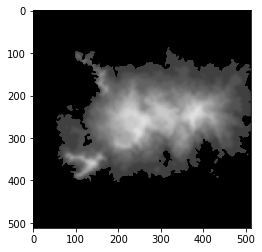

In [18]:
gen3D(hmap, tmap, smoothening=0, path='map 2.html')